*Luis Antonio Ortega Andrés   
Antonio Coín Castro*

# Continuous-time stochastic processes - HW 1

*The code developed below for Python 3.x is PEP8 compliant as verified by [autopep8](https://jupyter-contrib-nbextensions.readthedocs.io/en/latest/nbextensions/code_prettify/README_autopep8.html).*


In [1]:
from pylab import rcParams
%load_ext autoreload
%autoreload 2
%matplotlib inline
rcParams['figure.figsize'] = 10, 5

In [28]:
import numpy as np
from scipy import stats, integrate, special
import matplotlib.pyplot as plt
from IPython.display import HTML
import exercises as ex

np.random.seed(42)

## Exercise 1

We compare the theoretical distribution of a Poisson process with rate $\lambda=10$ with the distribution obtained from a simulation, both for the time instant $t=2$. We also compare two ways of simulating a Poisson process: one that uses the fact that interarrival times are exponentially distributed, and one that uses the order statistics of a uniform distribution.

In [12]:
# Process parameters
rate = 10
t = 2

# Theoretical PMF
T = 45
ns = np.arange(T)
pmf = stats.poisson.pmf(ns, rate*t)

# Simulation
M = 50000
events_v1 = ex.simulate_poisson_process_v1(rate, 0, t, M)
counts_v1 = [len(events_v1[m]) for m in range(M)]
events_v2 = ex.simulate_poisson_process_v2(rate, 0, t, M)
counts_v2 = [len(events_v2[m]) for m in range(M)]
counts = [counts_v1, counts_v2]

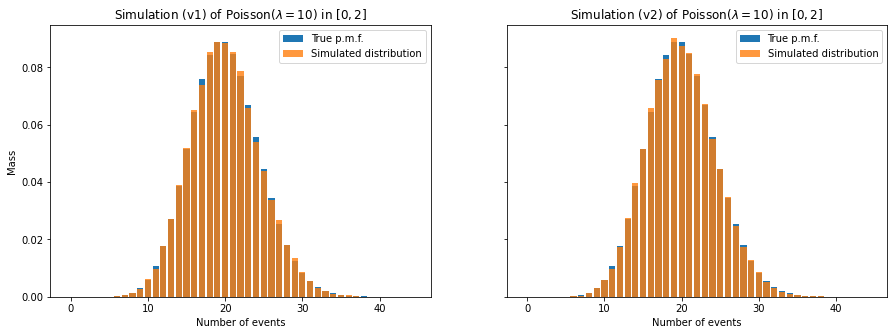

In [13]:
# Plot results to compare
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(15, 5))
axs[0].set_ylabel("Mass")
for i, count in enumerate(counts):
    bin_count = np.bincount(count, minlength=T)
    axs[i].bar(ns, pmf, label="True p.m.f.")
    axs[i].bar(ns, bin_count/np.sum(bin_count), 
               label="Simulated distribution", alpha=0.8)
    axs[i].set_title(f"Simulation (v{i + 1}) " +
                     r"of Poisson($\lambda=10$) in $[0, 2]$")
    axs[i].legend()
    axs[i].set_xlabel("Number of events")
plt.show()

## Exercise 2

In this exercise, we simulate a Poisson process with rate $\lambda = 5$ and explore the distributions of the first, second, fifth and tenth arrivals, comparing them to their respective theoretical (Erlang) distributions.

In [8]:
# Process parameters
rate = 5
beta = 1.0/rate
ns = [1, 2, 5, 10]

# Theoretical PDF
ts = np.arange(0, 6, 0.01)
pdfs = [stats.erlang.pdf(ts, a=n, scale=beta) for n in ns]

# Simulation
M = 50000
events = ex.simulate_poisson_process_v1(rate, 0, ts[-1], M)
arrivals = [[events[m][n - 1] for m in range(M)] for n in ns]

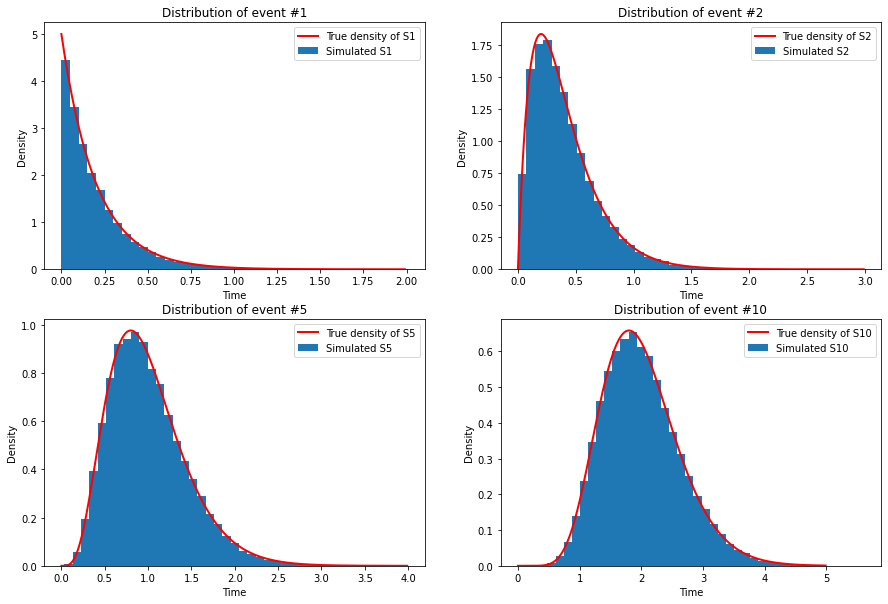

In [9]:
# Plot results to compare
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
ts_plot = [np.arange(0, m + 1, 0.01) for m in range(1, 5)]
for i in [0, 1]:
    for j in [0, 1]:
        nn = 2*i + j
        n = ns[nn]
        t = ts_plot[nn]

        axs[i, j].hist(arrivals[nn], label=f"Simulated S{n}", density=True,
                       bins=40)
        axs[i, j].plot(t, pdfs[nn][:len(t)], label=f"True density of S{n}",
                       color="red", lw=2)
        axs[i, j].set_title(f"Distribution of event #{n}")
        axs[i, j].set_xlabel("Time")
        axs[i, j].set_ylabel("Density")
        axs[i, j].legend()
plt.show()

## Exercise 4

We compute the theoretical probabilites of some events in a football match between two teams, in which the goal rate of each team is modelled by an (independent) Poisson process. We also simulate the appropriate processes and compute the empirical probabilites, to see that they coincide.

We know from basic statistics that the standard deviation of the sample mean of $n$ random variables can be estimated by $s\big/\sqrt{n}$, where $s^2$ is the unbiased sample variance. We compute this quantity to estimate the error of our calculations from the simulations.

In [14]:
# Match model
tmax = 90
rate_a = 0.02
rate_b = 0.03
def nt1(t): return stats.poisson(rate_a*t)
def nt2(t): return stats.poisson(rate_b*t)
def nt(t): return stats.poisson((rate_a + rate_b)*t)


# Simulate both processes independently
M = 50000
arrivals_team_a = ex.simulate_poisson_process_v2(rate_a, 0, tmax, M)
arrivals_team_b = ex.simulate_poisson_process_v2(rate_b, 0, tmax, M)

# Extract information about goals
goals_a = np.array([len(arrivals_team_a[m]) for m in range(M)])
goals_b = np.array([len(arrivals_team_b[m]) for m in range(M)])
total_goals = goals_a + goals_b

In [15]:
# 1. Probability that no goals are scored
p1 = nt(tmax).pmf(0)
cond1 = total_goals == 0
p1_sim = np.mean(cond1)
p1_err = np.std(cond1, ddof=1)/np.sqrt(M)
print(f"[Theoretical] Probability of no goals: {p1:.4f}")
print(f"[Simulated] Probability of no goals: {p1_sim:.4f} ± {p1_err:.4f}")

[Theoretical] Probability of no goals: 0.0111
[Simulated] Probability of no goals: 0.0111 ± 0.0005


In [16]:
# 2. Probability of at least two goals
p2 = nt(tmax).sf(1)
cond2 = total_goals >= 2
p2_sim = np.mean(cond2)
p2_err = np.std(cond2, ddof=1)/np.sqrt(M)
print(f"[Theoretical] Probability of at least two goals: {p2:.4f}")
print(
    f"[Simulated] Probability of at least two goals: {p2_sim:.4f} ± {p2_err:.4f}")

[Theoretical] Probability of at least two goals: 0.9389
[Simulated] Probability of at least two goals: 0.9381 ± 0.0011


In [17]:
# 3. Probability of A=1, B=2
p3 = nt1(tmax).pmf(1)*nt2(tmax).pmf(2)
cond3 = (goals_a == 1) & (goals_b == 2)
p3_sim = np.mean(cond3)
p3_err = np.std(cond3, ddof=1)/np.sqrt(M)
print(f"[Theoretical] Probability of A=1, B=2: {p3:.4f}")
print(f"[Simulated] Probability of A=1, B=2: {p3_sim:.4f} ± {p3_err:.4f}")

[Theoretical] Probability of A=1, B=2: 0.0729
[Simulated] Probability of A=1, B=2: 0.0703 ± 0.0011


In [18]:
# 4. Probability of draw
p4 = stats.skellam.pmf(0, rate_a*tmax, rate_b*tmax)  # 1st approach
p4_bis = np.exp(-tmax*(rate_a + rate_b)) * \
    special.iv(0, 2*tmax*np.sqrt(rate_a*rate_b))  # 2nd approach
cond4 = goals_a == goals_b
p4_sim = np.mean(cond4)
p4_err = np.std(cond4, ddof=1)/np.sqrt(M)
if np.isclose(p4, p4_bis):  # Both theoretical strategies coincide
    print(f"[Theoretical] Probability of draw: {p4:.4f}")
    print(f"[Simulated] Probability of draw: {p4_sim:.4f} ± {p4_err:.4f}")

[Theoretical] Probability of draw: 0.1793
[Simulated] Probability of draw: 0.1806 ± 0.0017


In [19]:
# 5. Probability of B scoring the first goal
p5 = integrate.quad(lambda t: 0.03*np.exp(-0.05*t), 0, tmax)[0]
cond5 = [1 if arrivals_team_b[m].size
         and (not arrivals_team_a[m].size
              or arrivals_team_b[m][0] < arrivals_team_a[m][0])
         else 0 for m in range(M)]
p5_sim = np.mean(cond5)
p5_err = np.std(cond5, ddof=1)/np.sqrt(M)
print(f"[Theoretical] Probability of B scoring the first goal: {p5:.4f}")
print(
    f"[Simulated] Probability of B scoring the first goal: {p5_sim:.4f} ± {p5_err:.4f}")

[Theoretical] Probability of B scoring the first goal: 0.5933
[Simulated] Probability of B scoring the first goal: 0.5926 ± 0.0022


## Exercise 6

We simulate the standard Wiener process in $[0,1]$ and compare the theoretical autocovariance function $\gamma(t, 0.25)=\min(t, 0.25)$ with the covariance estimated from the simulations.

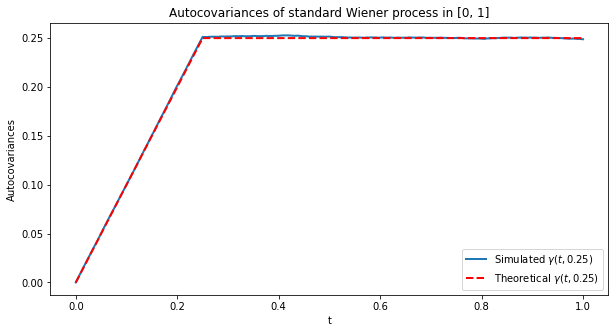

In [20]:
M = 50000
N = 1000
s = 0.25
s_index = int(s*N)

# Simulate processes
ts, bs = ex.simulate_arithmetic_BM(0, 0, 1, 0, 1, M, N)

# Compute sample covariance
simulated_cov = [np.mean(bs[:, t]*bs[:, s_index]) for t in range(len(ts))]

plt.plot(ts, simulated_cov, lw=2, label=r"Simulated $\gamma(t, 0.25)$")
plt.plot(ts, np.minimum(ts, 0.25), "--", lw=2, color="red",
         label=r"Theoretical $\gamma(t, 0.25)$")
plt.legend()
plt.xlabel("t")
plt.title("Autocovariances of standard Wiener process in [0, 1]")
plt.ylabel("Autocovariances")
plt.show()

## Exercise 7

We wish to plot the trajectories and the distribution of the final values of the following processes:

1. \( V_1(t)=\rho W(t) + \sqrt{1 - \rho^{2}}W'(t),\quad t \geq 0 \).
2. \( V_2(t)=-W(t), \quad t\geq 0 \).
3. \( V_3(t)=\sqrt{c}W(t/c),\quad t \geq 0, c > 0 \).

To this end, we will simulate $M=50000$ independent instances of the processes in $[0,2]$, discretized using a regular grid of $N=1000$ points. Moreover, we will choose the values $\rho=0.15$ and $c=\pi$. 

To satisfy ourserlves that the processes are standard Brownian motions, we plot the *expected* area in which the trajectories should lie. Specifically, since the distribution at each time $t$ must be $\mathcal N(0, \sqrt{t})$, and since we know that more than $99\%$ of the density of the normal distribution lies in $\mu \pm 3\sigma$, we fill the area between $0\pm 3\sqrt{t}$ for each $t$ to indicate the most likely enclosing shape of the trajectories. The empirical mean of the process is also highlighted in black.

*Note: to avoid cluttering the final graphs, we only show a few of the simulated trajectories.*

In [21]:
# Conditions for the simulation
M = 50000  # Number of trajectories
N = 1000  # Number of time steps
T = 2.0  # Length of simulation interval
mu, sigma = 0.0, 1.0  # Parameters of the process
t0, B0 = 0.0, 0.0

### Process $V_1(t)$

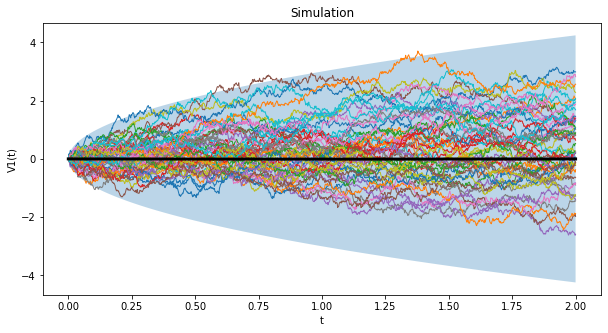

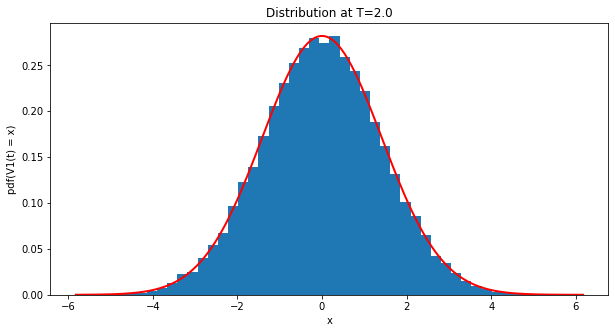

In [22]:
rho = 0.15
t, W1 = ex.simulate_arithmetic_BM(t0, B0, T, mu, sigma, M, N)
_, W2 = ex.simulate_arithmetic_BM(t0, B0, T, mu, sigma, M, N)
V1 = rho*W1 + np.sqrt(1 - rho**2)*W2
ex.plot_trajectories_and_distribution(t, V1, t0, B0, T, mu, sigma, "V1(t)")

### Process $V_2(t)$

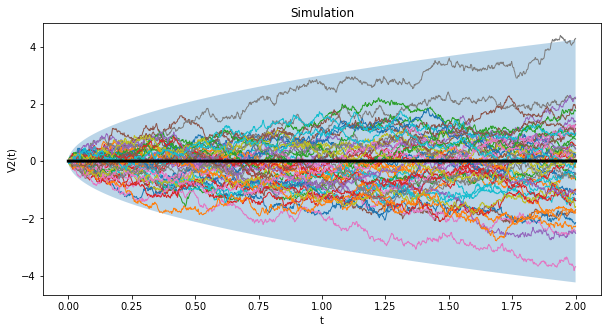

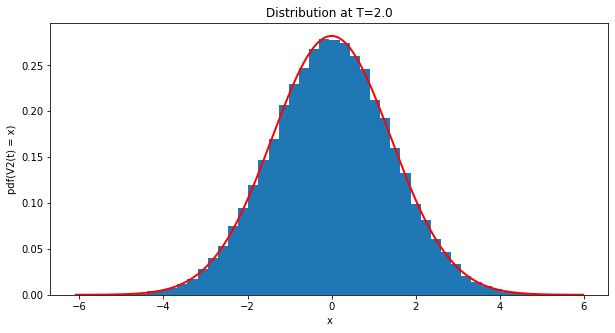

In [23]:
V2 = -W1
ex.plot_trajectories_and_distribution(t, V2, t0, B0, T, mu, sigma, "V2(t)")

### Process $V_3(t)$

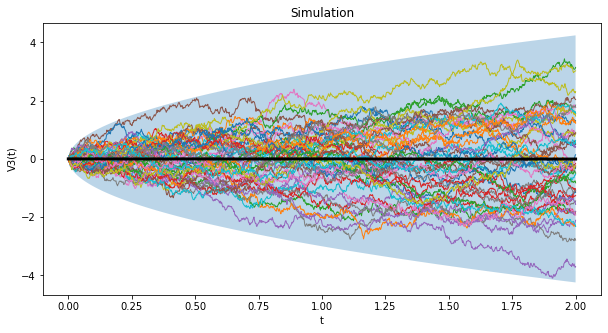

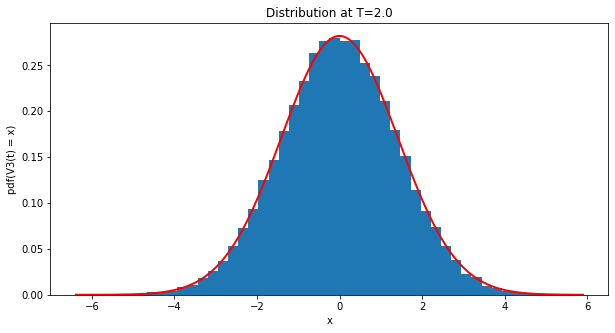

In [24]:
c = np.pi
t, W = ex.simulate_arithmetic_BM(t0, B0, T / c, mu, sigma, M, N)
V3 = np.sqrt(c) * W
ex.plot_trajectories_and_distribution(t * c, V3, t0, B0, T, mu, sigma, "V3(t)")

## Exercise 8

In this last exercise, we make an animation of the evolution of a Brownian motion process, and explore the distribution of the values at each time. The final animation is rendered in HTML to be displayed on this notebook. Again, we only show a few of the simulated trajectories (100 of them to be precise), but we use all of the simulations to compute the histogram of the values over time.

In [29]:
# Conditions for the simulation
M = 50000   # Number of trajectories
N = 1000  # Number of time steps
T = 2.0  # Length of simulation interval
mu, sigma = 1.3, 0.4  # Parameters of the process
t0, B0 = 0.0, 10.0

anim = ex.animate_arithmetic_BM(t0, B0, T, mu, sigma, M, N, (20, 5))
plt.close()
HTML(anim.to_jshtml())